# Fraud Detection via Graph Analysis

People interact. They call each other, exchange email messages or text to one another. Companies also interact. A company does thousands of transactions, like wiring money to the other companies or individuals.

If we consider agents (individual, company, etc.) as nodes, then an interaction between two nodes can be shown by an edge. Then, we can represent all interactions among the agents as a graph. Graphs play an important role in fraud detection because the structure of the graph and its subgraphs tell us about the interactions among the agents. For instance, if we observe that a group of agents interact frequently, then we can label this group as a clique (any pair of nodes in a clique has an edge between them). A clique may as well be an indication of a potential fraud.

[The Enron scandal](https://en.wikipedia.org/wiki/Enron_scandal) is about the collapse of the Enron Corporation after a major securities fraud had been revealed in October 2001. In this case study, we will use a set of email messages exchanged for a period of around three years from November, 1998 to December, 2002. These messages are compiled from [Enron data set](https://www.cs.cmu.edu/~./enron/).  We have downloaded three files from a [GitHub account](https://github.com/patperry/interaction-proc/tree/master/data/enron), which include the employee information, a summary of the email messages and a list of the recipients (an email can be received by multiple recipients).

First let's take a look at the employee information.

In [14]:
import pandas as pd

empdf = pd.read_table("employees.tsv", header=None)
empdf.columns = ['ID', 'Name', 'Dept', 'Company', 'Role', 'Gender', 'Rank']
empdf.head()

,ID,Name,Dept,Company,Role,Gender,Rank
0,1,John Arnold,Trading,ENA Gas Financial,VP Trading,Male,Senior
1,2,Harry Arora,Trading,ENA East Power,VP Trading,Male,Senior
2,3,Robert Badeer,Trading,ENA West Power,Mgr Trading,Male,Junior
3,4,Susan Bailey,Legal,ENA Legal,Specialist Legal,Female,Junior
4,5,Eric Bass,Trading,ENA Gas Texas,Trader,Male,Junior


The first column is the employee ID of the individual. 

We can check the upper level management in this list. Note that Kenneth Lay was the first CEO of Enron and after a few years, Jeff Skilling had been his successor. 

In [15]:
empdf[empdf['Role'].str.contains('CEO')]

,ID,Name,Dept,Company,Role,Gender,Rank
23,24,David W. Delainey,Other,EWS,President & CEO,Male,Senior
55,56,Stanley Horton,Other,ETS,President & CEO,Male,Senior
66,67,John J. Lavorato,Other,EWS,ENA President & CEO,Male,Senior
67,68,Kenneth Lay,Other,Enron,President & CEO,Male,Senior
81,82,Mike McConnell,Other,EWS,EGM President & CEO,Male,Senior
123,124,Jeff Skilling,Other,Enron,President & CEO,Male,Senior
146,147,Greg Whalley,Other,EWS,President & CEO,Male,Senior


Each line of the second file includes a summary of an email message. The first column is the message ID, the second column is the sender, the third column is the operating system time (Unix timestamp; seconds until January 1, 1970) and the last column is the employee ID of the sender.

In [16]:
with open("messages.tsv") as infile:
    for i in xrange(5): 
        print next(infile),

1	taylor-m/sent/11	910930020	Cd$ CME letter	138
2	taylor-m/sent/17	911459940	Indemnification	138
3	taylor-m/sent/18	911463840	Re: Indemnification	138
4	taylor-m/sent/23	911874180	Re: Coral Energy, L.P.	138
5	taylor-m/sent/27	912396120	Bankruptcy Code revisions	138


The third file shows the recipients. The first column is the message ID, the second column is the recipient number and the last column is the employee ID of the recipient.

In [17]:
with open("recipients.tsv") as infile:
    for i in xrange(10): 
        print next(infile),

1	1	59
2	1	15
3	1	15
4	1	109
4	2	49
4	3	120
4	4	59
5	1	45
5	2	53
6	1	113


We will assign a node to each employee and then add an edge between two nodes if the corresponding two eomployess exchanged an email. To construct our graph, we need two dictionaries.

In [18]:
emps = {} # Employees - {Employee ID: Last Name}
with open('employees.tsv', 'r') as infile:
    for line in infile:
        sp = line.split('\t')
        emps[int(sp[0])] = sp[1]

recs = {} # Receivers - {Message ID: [Receiver Last Names]\
with open('recipients.tsv', 'r') as infile:
    for line in infile:
        sp = line.split('\t')
        mesid = int(sp[0])
        rec = emps[int(sp[2])]
        if recs.has_key(mesid):
            recs[mesid].append(rec)
        else:
            recs[mesid] = [rec]

In [19]:
print emps

{1: 'John Arnold', 2: 'Harry Arora', 3: 'Robert Badeer', 4: 'Susan Bailey', 5: 'Eric Bass', 6: 'Don Baughman Jr.', 7: 'Sally Beck', 8: 'Robert Benson', 9: 'Lynn Blair', 10: 'Sandra F. Brawner', 11: 'Rick Buy', 12: 'Larry Campbell', 13: 'Larry F. Campbell', 14: 'Mike Carson', 15: 'Michelle Cash', 16: 'Monika Causholli', 17: 'Shelley Corman', 18: 'Sean Crandall', 19: 'Martin Cuilla', 20: 'Jeff Dasovich', 21: 'Dana Davis', 22: 'Clint Dean', 23: 'Craig Dean', 24: 'David W. Delainey', 25: 'James Derrick Jr.', 26: 'Stacy E. Dickson', 27: 'Lindy Donoho', 28: 'Tom Donohoe', 29: 'Chris Dorland', 30: 'Frank Ermis', 31: 'Daren J. Farmer', 32: 'Mary Fischer', 33: 'John M. Forney', 34: 'Drew Fossum', 35: 'Lisa Gang', 36: 'Randall L. Gay', 37: 'Rob G. Gay', 38: 'Tracy Geaccone', 39: 'Chris Germany', 40: 'Doug Gilbert-Smith', 41: 'Darron C. Giron', 42: 'John Griffith', 43: 'Mike Grigsby', 44: 'Mark Guzman', 45: 'Mark E. Haedicke', 46: 'Mary Hain', 47: 'Steven Harris', 48: 'Rod Hayslett', 49: 'Marie H

In [20]:
print recs

{1: ['Tana Jones'], 2: ['Michelle Cash'], 3: ['Michelle Cash'], 4: ['Elizabeth Sager', 'Marie Heard', 'Sara Shackleton', 'Tana Jones'], 5: ['Mark E. Haedicke', 'Jeffrey T. Hodge'], 6: ['Richard B. Sanders'], 7: ['Tana Jones'], 8: ['Tana Jones'], 9: ['Marie Heard'], 10: ['Tana Jones'], 11: ['Tana Jones'], 12: ['Marie Heard', 'Sara Shackleton', 'Tana Jones'], 13: ['Tana Jones'], 14: ['Tana Jones'], 15: ['Mark E. Taylor'], 16: ['Dan J. Hyvl', 'Stacy E. Dickson', 'Mark E. Haedicke', 'Jeffrey T. Hodge'], 17: ['Mark E. Taylor', 'Richard B. Sanders', 'Jeffrey T. Hodge'], 18: ['Jeffrey T. Hodge'], 19: ['Tana Jones'], 20: ['Mark E. Haedicke'], 21: ['Tana Jones'], 22: ['Marie Heard'], 23: ['Carol St Clair'], 24: ['Tana Jones'], 25: ['Richard B. Sanders', 'Tana Jones'], 26: ['Tana Jones'], 27: ['Richard B. Sanders', 'Tana Jones'], 28: ['Debra Perlingiere', 'Elizabeth Sager', 'Dan J. Hyvl', 'Michelle Cash', 'Marie Heard', 'Stacy E. Dickson', 'Richard B. Sanders', 'Gerald Nemec', 'Mark E. Haedicke'

It is important to note that there could be several message exchanges between two individuals. Therefore, our graph has multiple edges between two nodes. Such a graph is called a multi graph. We also use the timestamp as a label on each edge. Later we will use these labels to analyze the changes in the network structure as time progresses.

In [21]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx

GE = nx.MultiGraph()

mesidtime = {} #Messages - {Message ID: [Receiver Names]}
with open('messages.tsv', 'r') as infile:
    for line in infile:
        sp = line.split('\t')
        mesid = int(sp[0])
        timestamp = sp[2]
        sender = emps[int(sp[4])]
        for rec in recs[mesid]:
            GE.add_edge(sender, rec, time=timestamp)
        mesidtime[mesid] = timestamp

Our graph is ready. We can try to plot it but it will not look very pretty as we have a relatively large graph.

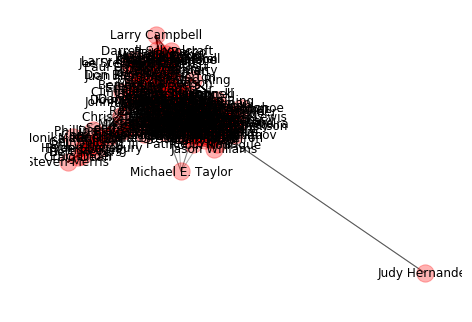

In [22]:
nx.draw(GE, with_labels = True, alpha=0.3)

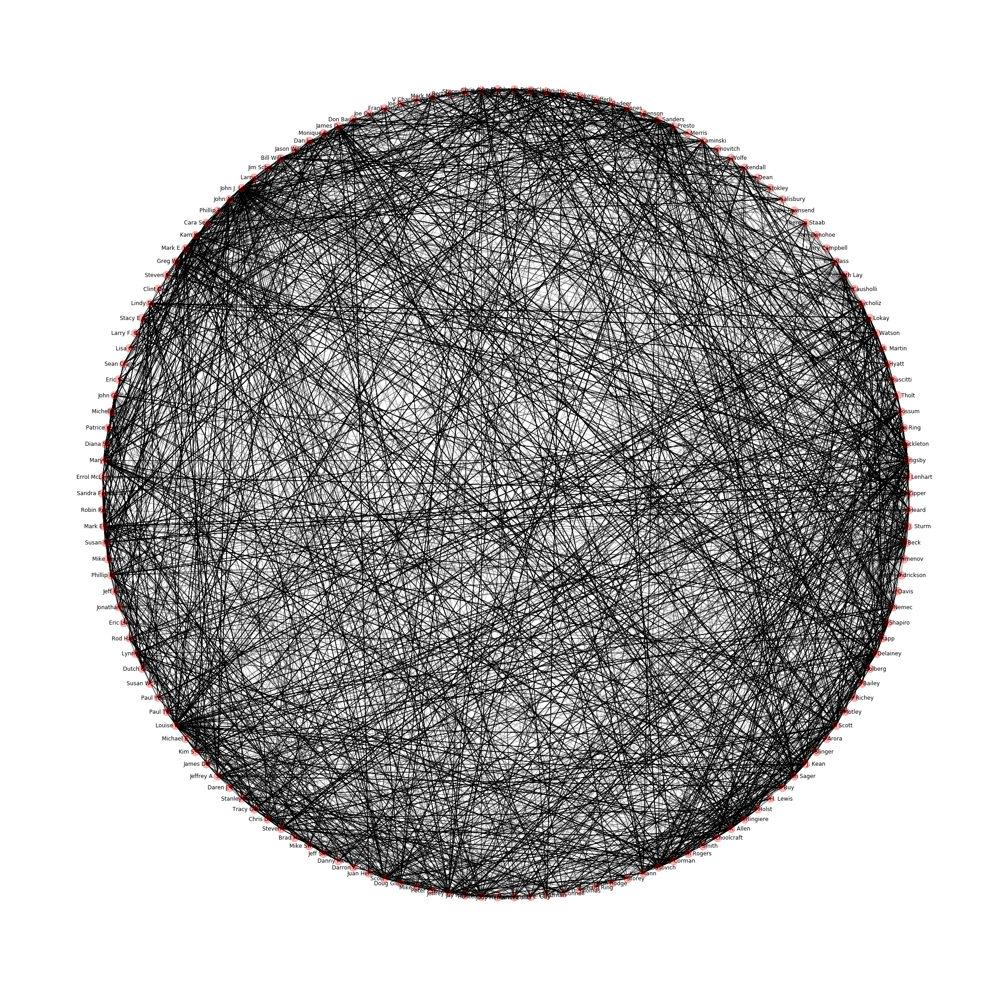

In [23]:
plt.figure(figsize=(30,30)) 

nx.draw_circular(GE, with_labels = True, alpha=0.3)

It might be best to store it in one of the formats, where a proper graph visualization tool like [Gephi](https://gephi.org) can be used.

In [24]:
nx.write_gexf(GE, 'enron.gexf')

<img src="./figures/enron.png" alt="Enron graph drawn in Gephi" style="width: 600px;"/>

Instead of visualization, we can do some graph analysis. The degree of a node is simply the number of edges adjacent to that node.

In [25]:
ndegrees = nx.degree(GE).items()
ndegrees[0:3]

[('Andy Zipper', 316), ('Matthew Lenhart', 795), ('Mike Grigsby', 1563)]

We can then check the top ten _popular_ employees.

In [26]:
sndegrees = sorted(ndegrees, key=lambda tup: tup[1], reverse=True)
print sndegrees[0:10]

[('Jeff Dasovich', 4705), ('Tana Jones', 3722), ('James D. Steffes', 3463), ('Sara Shackleton', 2688), ('Mark E. Taylor', 2395), ('Richard Shapiro', 2252), ('Steven J. Kean', 1903), ('Carol St Clair', 1812), ('Mike Grigsby', 1563), ('Louise Kitchen', 1411)]


The most popular employee is Jeff Dasovich. He is the governmental affairs executive of Enron. How about the others in top five.

In [27]:
empdf[empdf['Name'].str.contains('Dasovich', na=False) | 
      empdf['Name'].str.contains('Jones', na=False) |
      empdf['Name'].str.contains('Steffes', na=False) |
      empdf['Name'].str.contains('Shackleton', na=False) |
      empdf['Name'].str.contains('Mark E. Taylor', na=False)]

,ID,Name,Dept,Company,Role,Gender,Rank
19,20,Jeff Dasovich,Legal,Regulatory and Government Affairs,Director,Male,Senior
58,59,Tana Jones,Legal,ENA Legal,Specialist Legal,Female,Junior
119,120,Sara Shackleton,Legal,ENA Legal,Gen Cnsl Asst,Female,Junior
130,131,James D. Steffes,Legal,Regulatory and Government Affairs,VP of Government Affairs,Male,Senior
137,138,Mark E. Taylor,Legal,ENA Legal,VP & Gen Cnsl,Male,Senior


No wonder they are all on the legal side of the business. We can check the list of people that Dasovich contacted.

In [28]:
print GE.neighbors('Jeff Dasovich')

['John M. Forney', 'Mike Grigsby', 'Drew Fossum', 'Richard Ring', 'Jane M. Tholt', 'Louise Kitchen', 'Kim S. Ward', 'Kevin Hyatt', 'James D. Steffes', 'Shelley Corman', 'Kimberly Watson', 'Greg Whalley', 'Bill Williams III', 'Michelle Lokay', 'Phillip K. Allen', 'Barry Tycholiz', 'John J. Lavorato', 'Keith Holst', 'Mike Swerzbin', 'Kenneth Lay', 'Teb Lokey', 'Rick Buy', 'Chris Stokley', 'Mark E. Haedicke', 'Steven Harris', 'Elizabeth Sager', 'Jeff Skilling', 'Steven J. Kean', 'Lindy Donoho', 'Susan Scott', 'Vince J. Kaminski', 'Kevin M. Presto', 'Richard B. Sanders', 'David W. Delainey', 'Doug Gilbert-Smith', 'Richard Shapiro', 'Robert Badeer', 'Mary Hain', 'Jeffrey T. Hodge', 'Fletcher J. Sturm']


## Changes in Time

This data set spans a time interval of around three years. Therefore, it could be nice to look at the temporal dynamics of the network. How did the graph evolve in time? Did the cliques change significantly over time?

To answer these questions, we can use the timestamps on the edges. First we need one function to convert the operating system time to human readable dates.

In [29]:
from datetime import datetime

# Human readable OS time in "datetime" class
def humtime(ostime):
    strtime = datetime.fromtimestamp(int(ostime)).strftime('%d-%m-%Y %H.%M')
    time = datetime.strptime(strtime, '%d-%m-%Y %H.%M')
    return time

print humtime('911874180')

1998-11-24 05:23:00


Next, we can extract the subgraphs of our original graph by checking the times of the exchanged messages. It is best to write a function for this, since we shall analyze the subgraphs for different time periods. 

In [30]:
def retsubg(G, day=range(1,32), month=range(1,13), year=1998):
    if type(day) == int: day = [day]
    if type(month) == int: month = [month]
    if type(year) == int: year = [year]

    edges = []
    for i, j, attr in G.edges(data=True):
        yr = humtime(attr['time']).year
        mo = humtime(attr['time']).month
        dy = humtime(attr['time']).day
        if (yr in year) and (mo in month) and (dy in day):
            edges.append((i, j))
    return nx.MultiGraph(edges)

We can now draw the graph for a certain month. How about drawing the graph for the tenth month of year 2000, when everything was alright.

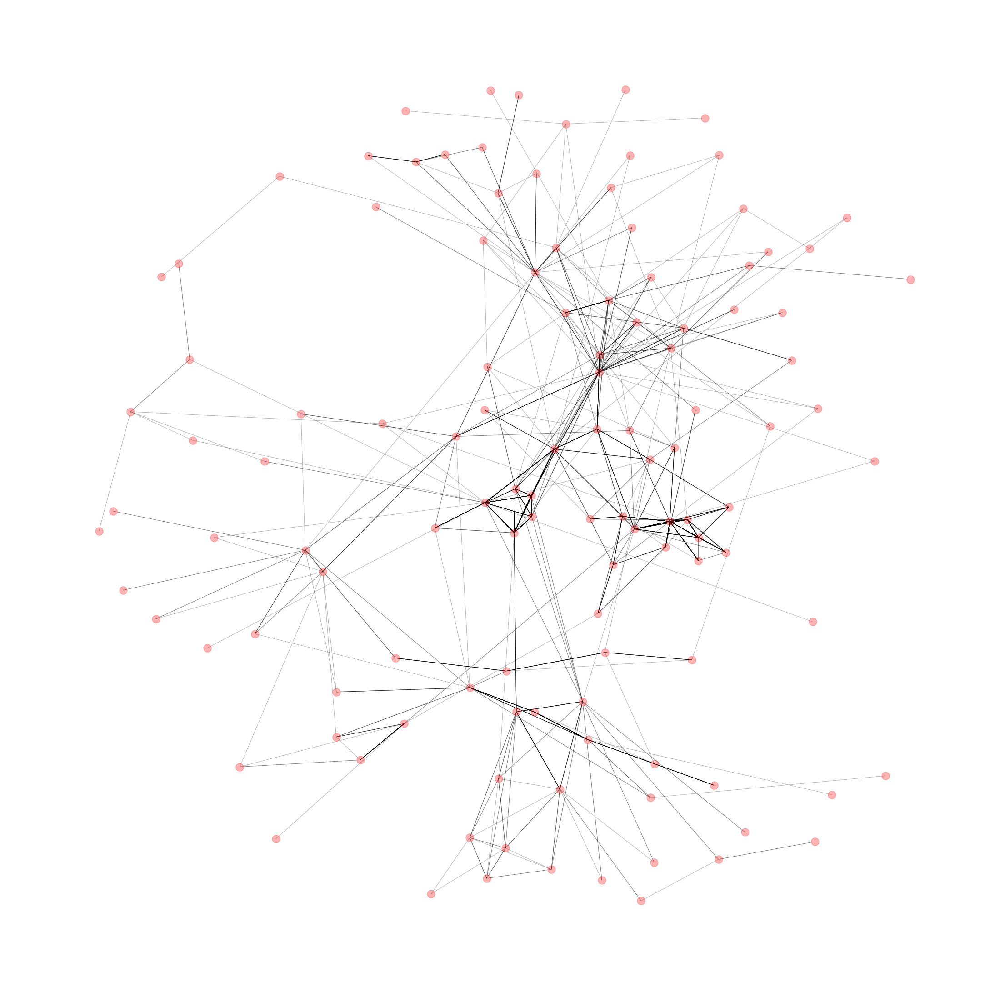

In [31]:
mt = 10
yr = 2000
subG = retsubg(GE, month=mt, year=yr)
plt.figure(figsize=(30,30)) 

nx.draw(subG, with_labels=False, alpha=0.3, font_size = 24)

Now let us draw the tenth month of 2001, when the scandal broke out, and the month after that. 

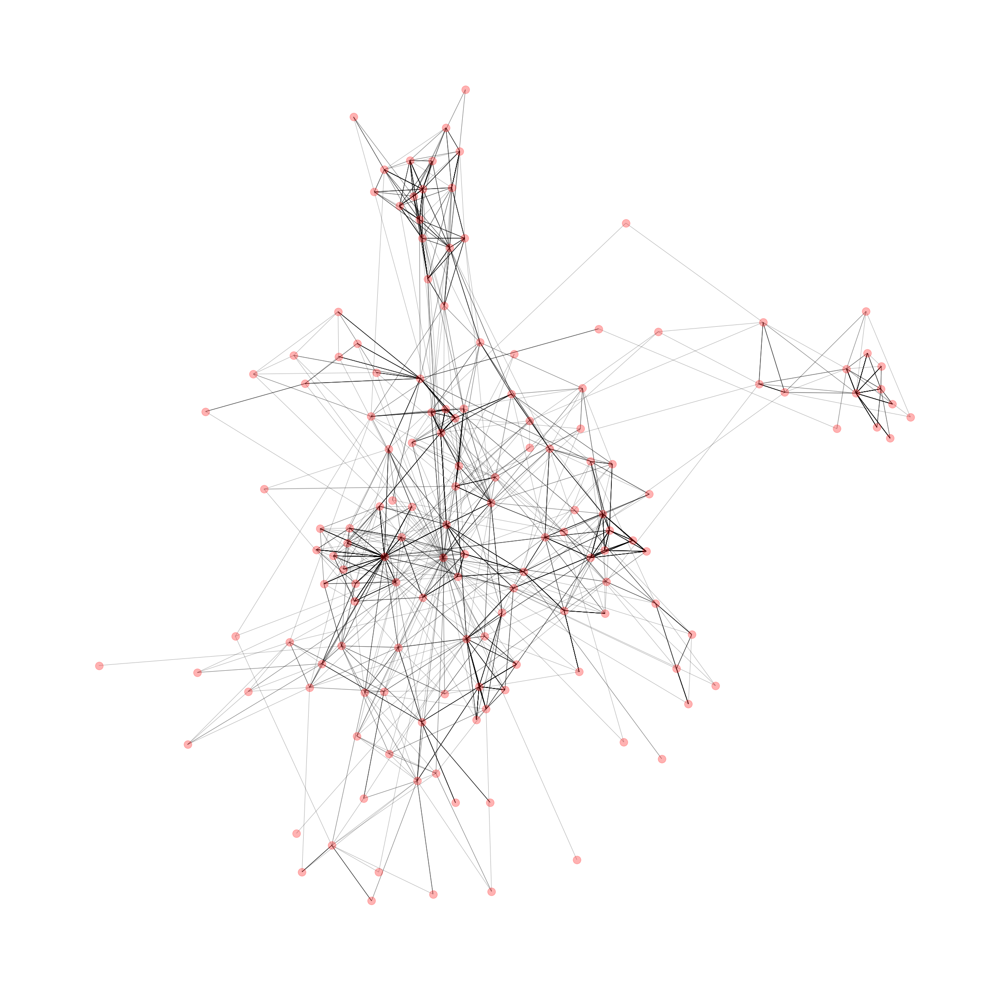

In [32]:
mt = 10
yr = 2001
subG = retsubg(GE, month=mt, year=yr)
plt.figure(figsize=(30,30)) 
nx.draw(subG, with_labels=False, alpha=0.3,  font_size = 24)

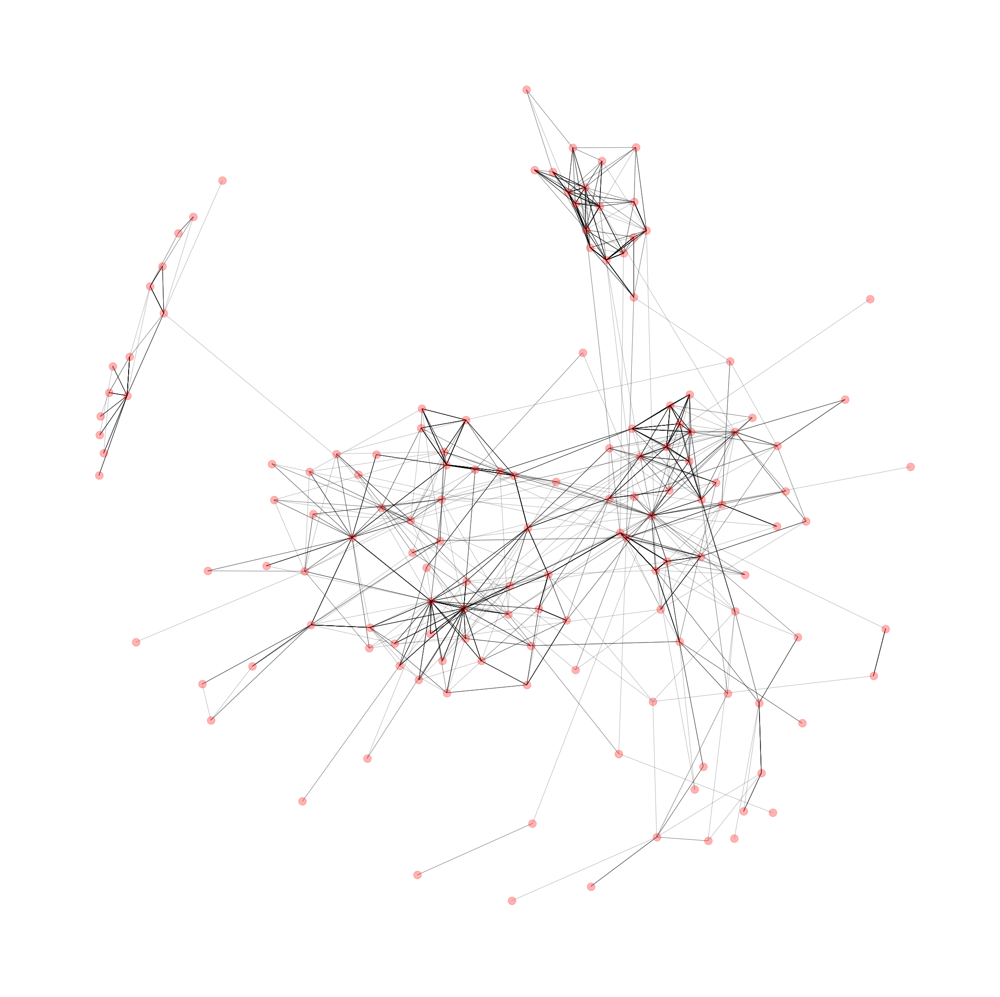

In [33]:
mt = 11
yr = 2001
subG = retsubg(GE, month=mt, year=yr)
plt.figure(figsize=(30,30)) 
nx.draw(subG, with_labels=False, alpha=0.3,  font_size = 24)

We see that after the scandal, the graph has more cliques than it has in the previous month. We can even export this file into JSON format that can be opened with an interactive graph plotting tool.

In [34]:
import json
from networkx.readwrite import json_graph
d = json_graph.node_link_data(subG)
json.dump(d, open('enron.json','w'))

Here is an HTML [file](enron.html) that uses this particular graph file. It would be more interesting to see the progression of the subgraphs in the same year.

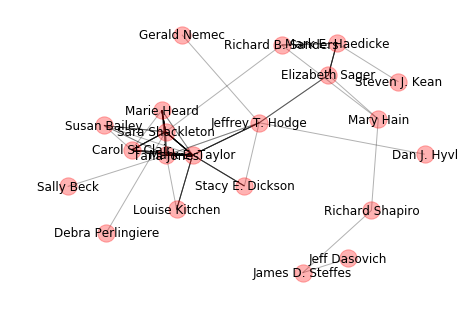

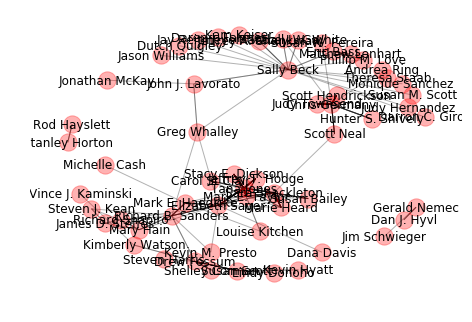

In [35]:
import matplotlib.pyplot as plt

yr = 1999
mts = [11, 12]
for mt in mts:
    subG = retsubg(GE, month=mt, year=yr)
    nx.draw(subG, with_labels=True, alpha=0.3)
    plt.show()

We can also check how the contacts of an employee change over time. Let's check the late CEO Jeff Skilling and owner Kenneth Lay.

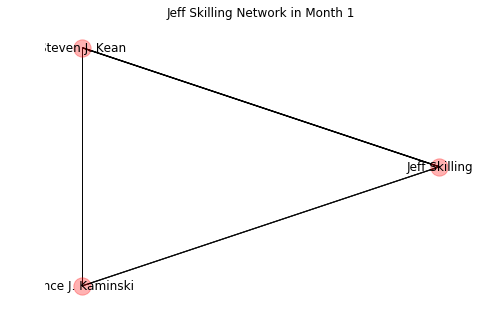

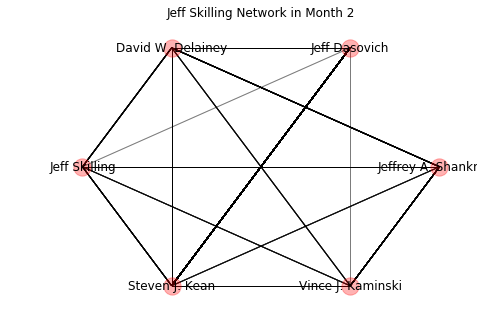

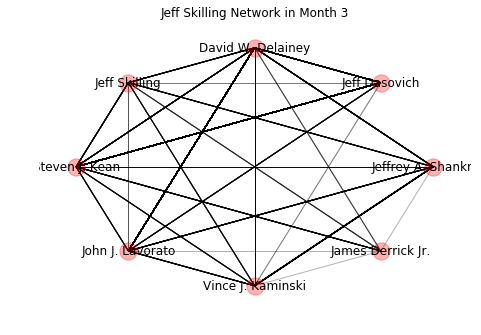

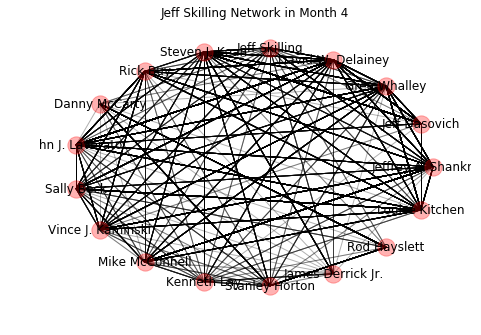

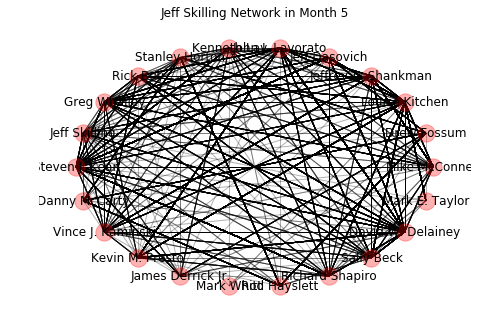

...

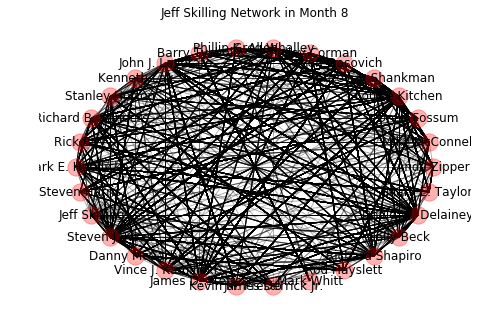

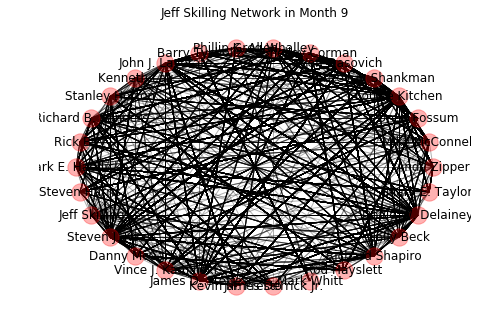

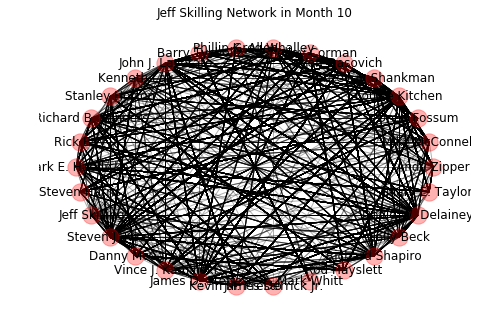

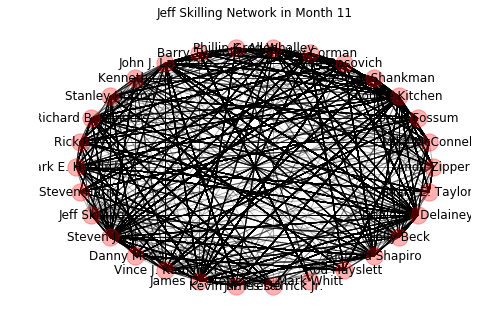

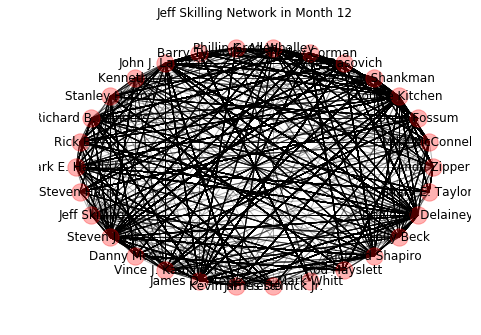

In [36]:
name = 'Jeff Skilling'
yr = 2001
mts = range(1, 13)
ngbrs = [name]
for mt in mts:
    subG = retsubg(GE, month=mt, year=yr)
    if name in subG.nodes():
        ngbrs = list(set(ngbrs + subG.neighbors(name)))
    nx.draw_circular(GE.subgraph(ngbrs), with_labels=True, alpha=0.3)
    plt.title('Jeff Skilling Network in Month ' + str(mt))
    plt.show()

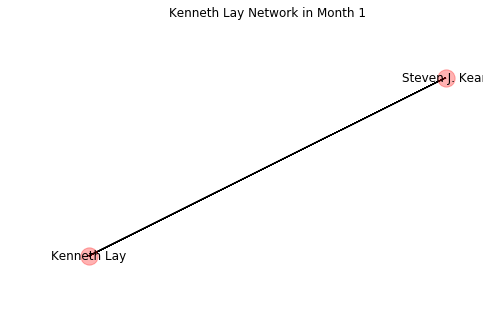

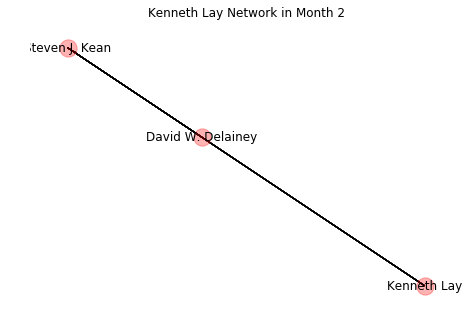

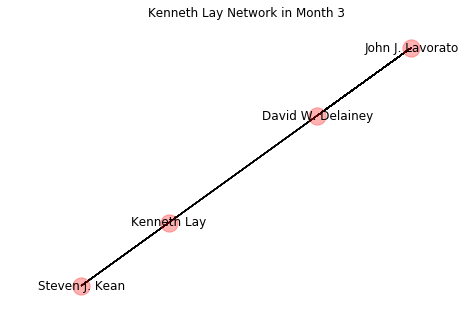

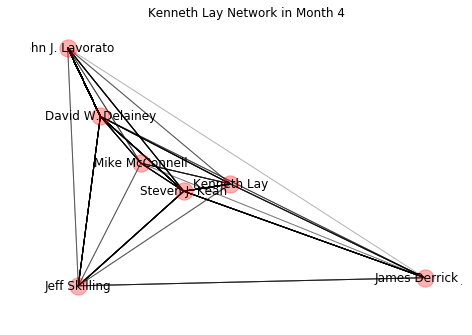

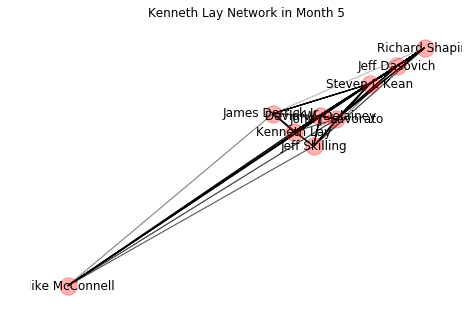

...

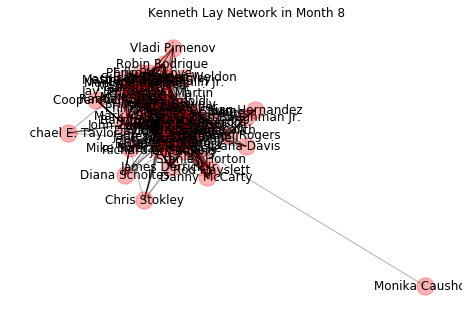

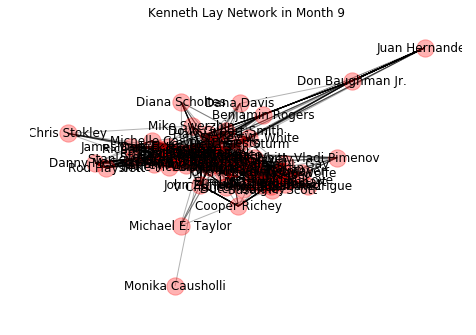

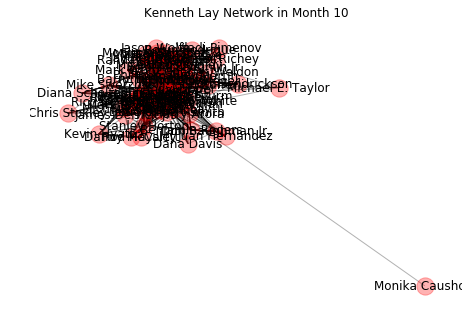

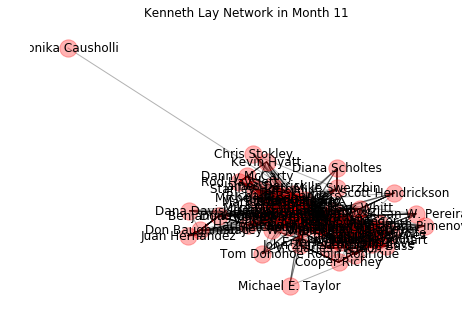

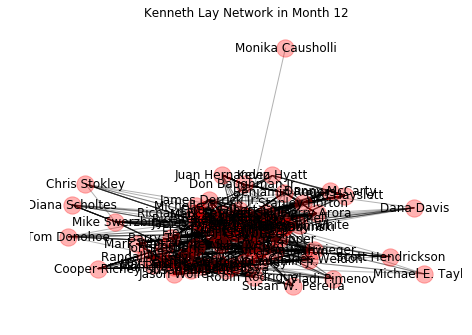

In [37]:
name = 'Kenneth Lay'
yr = 2001
mts = range(1, 13)
ngbrs = [name]
for mt in mts:
    subG = retsubg(GE, month=mt, year=yr)
    if name in subG.nodes():
        ngbrs = list(set(ngbrs + subG.neighbors(name)))
    nx.draw(GE.subgraph(ngbrs), with_labels=True, alpha=0.3)
    plt.title('Kenneth Lay Network in Month ' + str(mt))
    plt.show()
        

Next, we shall find the cliques in December, 1999 and November, 2001. If we plot the cliques one by one, then it may be easier to observe the key employees.

['Matthew Lenhart', 'Eric Bass']
['Chris Germany', 'Judy Townsend']
['Chris Germany', 'Scott Neal']
['Chris Germany', 'Andrea Ring']
['Chris Germany', 'Scott Hendrickson']
['Chris Germany', 'Randall L. Gay']
['Chris Germany', 'Hunter S. Shively']
['Chris Germany', 'Susan W. Pereira']
['Jonathan McKay', 'John J. Lavorato']
['Sara Shackleton', 'Scott Neal']
['Sara Shackleton', 'Tana Jones', 'Mark E. Taylor', 'Elizabeth Sager', 'Marie Heard']
['Sara Shackleton', 'Tana Jones', 'Mark E. Taylor', 'Susan Bailey']
['Sara Shackleton', 'Tana Jones', 'Mark E. Taylor', 'Carol St Clair']
['Drew Fossum', 'Kimberly Watson']
['Drew Fossum', 'Richard B. Sanders']
['Drew Fossum', 'Susan Scott']
['Drew Fossum', 'Shelley Corman']
['Drew Fossum', 'Steven Harris']
['Stacy E. Dickson', 'Tana Jones', 'Mark E. Taylor']
['Louise Kitchen', 'Mark E. Haedicke', 'Mark E. Taylor']
['Kevin Hyatt', 'Susan Scott']
['James D. Steffes', 'Richard Shapiro', 'Mary Hain']
['James D. Steffes', 'Richard Shapiro', 'Steven J. Ke

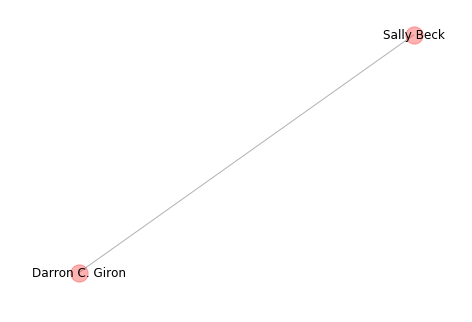

In [38]:
import time
import pylab as pl
from IPython import display

subG = retsubg(GE, month=12, year=1999)

for clique in nx.find_cliques(subG):
    pl.clf()
    nx.draw(subG.subgraph(clique), with_labels=True, alpha=0.3)
    display.clear_output(wait=True)
    display.display(pl.gcf())
    time.sleep(0.1)
    
display.clear_output()

count = 0
for clique in nx.find_cliques(subG):
    print clique
    count = count+1
    
print count


['Matthew Lenhart', 'Kam Keiser', 'Eric Bass', 'Jason Wolfe']
['Matthew Lenhart', 'Kam Keiser', 'Eric Bass', 'Phillip M. Love']
['Matthew Lenhart', 'Kam Keiser', 'Mike Grigsby', 'Frank Ermis']
['Matthew Lenhart', 'Kam Keiser', 'Mike Grigsby', 'Jason Wolfe']
['Matthew Lenhart', 'Kam Keiser', 'Mike Grigsby', 'Tori Kuykendall', 'Susan M. Scott']
['Matthew Lenhart', 'Kam Keiser', 'Mike Grigsby', 'Tori Kuykendall', 'Randall L. Gay']
['Andrea Ring', 'Jonathan McKay', 'Scott Neal', 'Sandra F. Brawner', 'Phillip M. Love']
['Drew Fossum', 'Shelley Corman', 'Tracy Geaccone', 'Kimberly Watson']
['Drew Fossum', 'Shelley Corman', 'Tracy Geaccone', 'Rod Hayslett', 'Danny McCarty']
['Drew Fossum', 'Shelley Corman', 'Lynn Blair', 'Kimberly Watson']
['Drew Fossum', 'Steven Harris', 'Danny McCarty', 'Rod Hayslett', 'Tracy Geaccone']
['Drew Fossum', 'Steven Harris', 'Tracy Geaccone', 'Kimberly Watson']
['Drew Fossum', 'Steven Harris', 'Jeff Dasovich']
['Drew Fossum', 'Steven Harris', 'Bill Rapp', 'Kimber

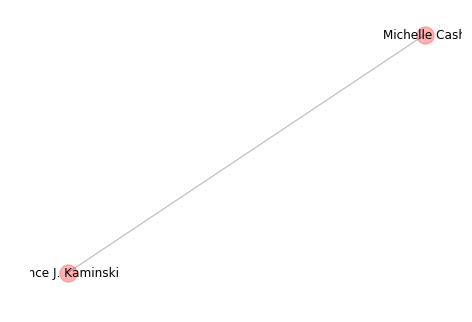

In [39]:
import time
import pylab as pl
from IPython import display

subG = retsubg(GE, month=11, year=2001)
for clique in nx.find_cliques(subG):
    print clique
    
for clique in nx.find_cliques(subG):
    pl.clf()
    nx.draw(subG.subgraph(clique), with_labels=True, alpha=0.3)
    display.clear_output(wait=True)
    display.display(pl.gcf())
    time.sleep(0.01)
    
display.clear_output()

count = 0
for clique in nx.find_cliques(subG):
    print clique
    count = count+1
    
print count

# Karate Club

Zachary's Karate Club is one of the pioneering studies in social networks. It is a social network of a karate club, studied by Wayne W. Zachary. During the study a conflict between the the president and the instructor split the club in two. 


Basing on the network Zachary was able to predict the position of all members but one.

For more information you can check:
https://en.wikipedia.org/wiki/Zachary%27s_karate_club
http://nbviewer.jupyter.org/github/shestakoff/social_ntwks/blob/master/dense_motifs.ipynb

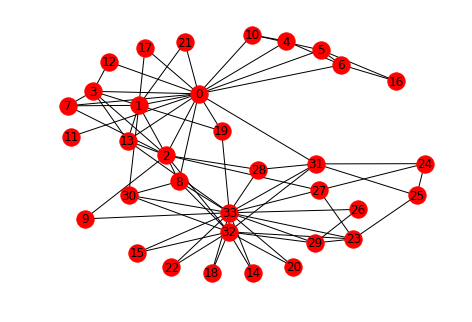

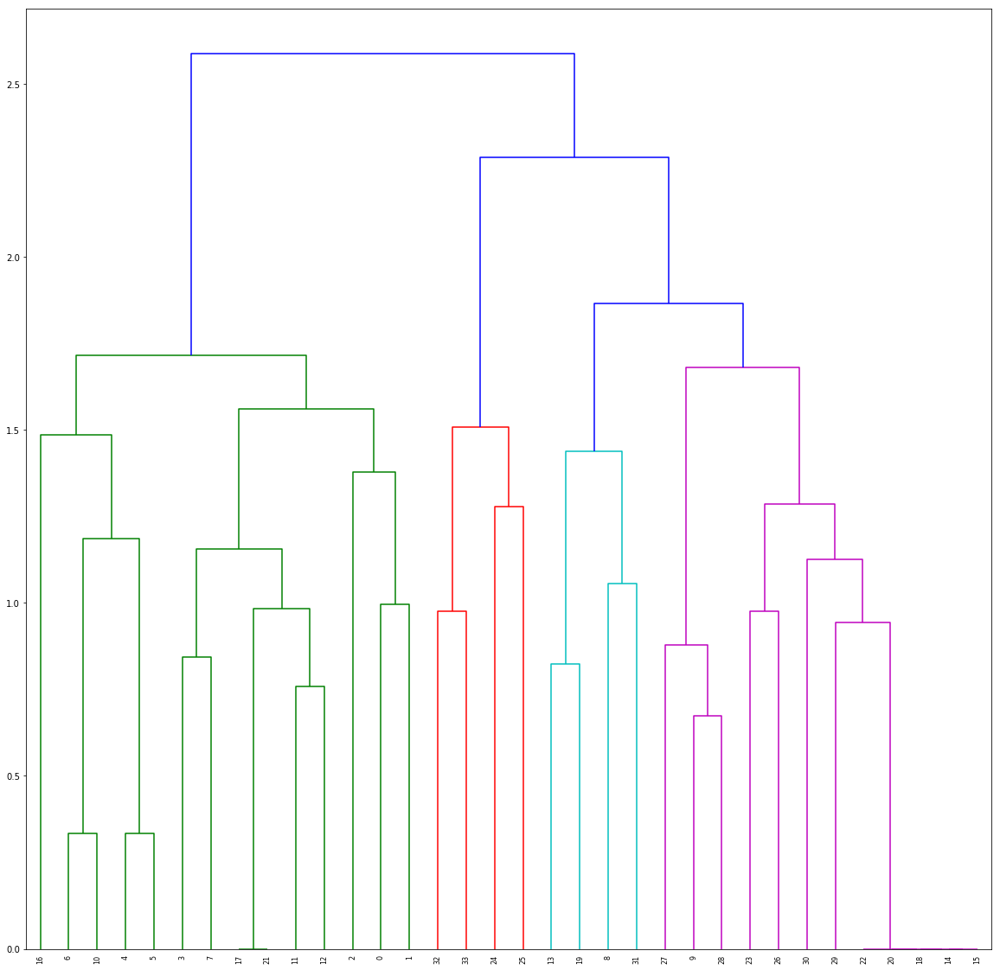

In [40]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist, squareform

G = nx.karate_club_graph()
nx.draw(G, with_labels=True)
A = nx.to_numpy_matrix(G)
M = pdist(A, 'cosine')
M = squareform(M)
Z = hierarchy.average(M)
plt.figure(figsize=(20,20))
D = hierarchy.dendrogram(Z, labels= G.nodes(), leaf_rotation= 90)
